<a href="https://colab.research.google.com/github/AnushaShivakumar/Spotify_Data_Visualization/blob/main/Information_Visulaization_ans797.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [37]:
import pandas as pd
import numpy as np

In [38]:
data = pd.read_csv("/content/spotify_songs_dataset.csv")

In [39]:
print(data.head())



  song_id               song_title             artist              album  \
0  SP0001  Space executive series.       Sydney Clark              What.   
1  SP0002     Price last painting.  Connor Peters DDS   Nature politics.   
2  SP0003                   Piece.         Anna Keith             Visit.   
3  SP0004     Power industry your.    Zachary Simpson  Behavior evening.   
4  SP0005      Food animal second.  Christopher Mcgee             Front.   

        genre release_date  duration  popularity    stream language  \
0  Electronic   1997-11-08     282.0          42  35055874  English   
1  Electronic   2015-05-10     127.0          50   9249527  English   
2         Pop   2024-07-08       NaN          10  76669110  English   
3     Hip-Hop   2022-08-15     214.0          86  34732016  English   
4         Pop   2023-03-05     273.0          63  96649372  English   

  explicit_content            label       composer           producer  \
0              Yes          Def Jam   Amy H

In [40]:
print(data.columns)


Index(['song_id', 'song_title', 'artist', 'album', 'genre', 'release_date',
       'duration', 'popularity', 'stream', 'language', 'explicit_content',
       'label', 'composer', 'producer', 'collaboration'],
      dtype='object')


In [41]:
import pandas as pd

# Assuming your data is loaded into the 'data' dataframe
# Ensure that 'duration' and 'popularity' are numeric
data['duration'] = pd.to_numeric(data['duration'], errors='coerce')
data['popularity'] = pd.to_numeric(data['popularity'], errors='coerce')

# Drop rows with NaN values in 'duration' or 'popularity'
data = data.dropna(subset=['duration', 'popularity'])

# Check the cleaned columns
print(data[['duration', 'popularity']].head())


   duration  popularity
0     282.0          42
1     127.0          50
3     214.0          86
4     273.0          63
5     312.0          74


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming your data is loaded into the 'data' dataframe
# Grouping by genre and release year to calculate average popularity and variation (std)
trend_data = data.groupby(['genre', 'release_year']).agg({'popularity': ['mean', 'std']}).reset_index()

# Renaming the columns for easier access
trend_data.columns = ['genre', 'release_year', 'mean_popularity', 'std_popularity']

# Create a line plot with error bars to show average popularity by genre over time
fig = px.line(
    trend_data,
    x='release_year',
    y='mean_popularity',
    color='genre',
    error_y='std_popularity',
    title="Trends in Music Popularity: A 30-Year Overview",
    labels={"release_year": "Year", "mean_popularity": "Average Popularity"},
    line_group='genre',
    color_discrete_sequence=px.colors.sequential.Blues  # Subtle colors for a professional look
)

# Customize the layout with Spotify-inspired design, but with white background
fig.update_layout(
    title_font=dict(size=24, color="#0077b6", family="Arial, sans-serif", weight="bold"),  # Change title color to #0077b6
    title_x=0.5,  # Center the title
    xaxis_title="",  # Remove x-axis title (Year)
    yaxis_title="Popularity",
    plot_bgcolor="white",  # White background for plot
    paper_bgcolor="white",  # White paper background
    font=dict(color="black"),  # Black text for readability
    xaxis=dict(tickangle=45, gridcolor="#1DB954"),  # Spotify green for x-axis gridlines
    yaxis=dict(showgrid=True, gridcolor="#1DB954"),  # Spotify green for y-axis gridlines
    legend_title=dict(font=dict(size=14, color="black")),  # Black legend title for clarity
    legend=dict(
        title="Music Genre",
        font=dict(size=12, color="black"),
        orientation="h",  # Horizontal legend
        x=0.5, y=-0.1,  # Position the legend
        xanchor="center", yanchor="top"
    ),
    margin=dict(l=40, r=40, t=100, b=100)  # Adjust margins for better spacing
)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming 'data' is your dataframe containing the Spotify dataset
# Grouping by release year, genre, and explicit content to calculate the counts
explicit_content_data = data.groupby(['release_year', 'genre', 'explicit_content']).size().reset_index(name='count')

# Pivot the data to have explicit and non-explicit columns
explicit_content_pivot = explicit_content_data.pivot_table(index=['release_year', 'genre'], columns='explicit_content', values='count', fill_value=0).reset_index()

# Renaming columns for clarity
explicit_content_pivot.columns = ['release_year', 'genre', 'Non-Explicit', 'Explicit']

# Create a stacked area chart for trends
fig = px.area(
    explicit_content_pivot,
    x='release_year',
    y=['Non-Explicit', 'Explicit'],
    color='genre',
    title="Trends in Explicit Content Across Music Genres Over Time",
    labels={"release_year": "Year", "value": "Track Count"},
    line_group='genre',
    color_discrete_sequence=['#0177b6', '#008C9E', '#55A8A1', '#8AC8C0'],  # Updated custom shades
    template="plotly_white"  # Clean, white background
)

# Customize layout to match design
fig.update_layout(
    title_font=dict(size=24, color="#0077b6", family="Arial"),  # Custom title color
    title_x=0.5,  # Center the title
    xaxis_title="Year",
    yaxis_title="Track Count",
    font=dict(color="black"),  # Black font for readability
    xaxis=dict(showgrid=True, gridcolor="#E0E0E0"),  # Light gridlines
    yaxis=dict(showgrid=True, gridcolor="#E0E0E0"),  # Light gridlines
    legend_title=dict(font=dict(size=14, color="black")),  # Clear legend title
    margin=dict(l=40, r=40, t=100, b=100)  # Adjust margins for better spacing
)

# Show the plot
fig.show()


In [57]:
import pandas as pd
import plotly.express as px

# Assuming your data is loaded into the 'data' dataframe
# Group the data by genre and release year to calculate average popularity
trend_data = data.groupby(['genre', 'release_year']).agg({'popularity': 'mean'}).reset_index()

# Create a bar chart to visualize average popularity of each genre over the years
fig = px.bar(
    trend_data,
    x='release_year',  # X-axis is the release year
    y='popularity',  # Y-axis is the average popularity
    color='genre',  # Color by genre
    barmode='group',  # Group bars by genre
    title="Rise and Fall of Music Genres Over Time",
    labels={"release_year": "Year", "popularity": "Average Popularity"},
color_discrete_sequence=px.colors.sequential.Viridis  # Subtle color palette
)

# Customize the layout for a clean design
fig.update_layout(
    title_font=dict(size=24, color="#023e8a"),  # Spotify green for the title
    title_x=0.5,  # Center the title
    xaxis_title="",
    yaxis_title="Average Popularity",
    plot_bgcolor="white",  # White background for the plot
    paper_bgcolor="white",  # Paper background to match plot
    font=dict(color="black"),  # Black text for readability
    xaxis=dict(tickangle=45, gridcolor="gray"),  # Subtle gridlines for x-axis
    yaxis=dict(showgrid=True, gridcolor="gray"),  # Light gridlines for y-axis
    legend_title=dict(font=dict(size=14, color="black")),  # Black legend title for clarity
    legend=dict(
        title="Music Genre",
        font=dict(size=12, color="black"),
        orientation="h",  # Horizontal legend
        x=0.5, y=-0.1,  # Position the legend below the chart
        xanchor="center", yanchor="top"
    ),
    margin=dict(l=40, r=40, t=100, b=100)  # Adjust margins for better spacing
)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming your data is loaded into the 'data' dataframe
# Grouping by genre and release year to calculate average popularity
trend_data = data.groupby(['genre', 'release_year']).agg({'popularity': 'mean'}).reset_index()

# Pivoting the data to create a matrix of average popularity per genre per year
heatmap_data = trend_data.pivot(index='release_year', columns='genre', values='popularity')

# Create a heatmap
fig = px.imshow(heatmap_data,
                color_continuous_scale='Blues',  # Use a customized blue scale
                labels={'x': 'Genre', 'y': 'Year', 'color': 'Popularity'},
                title="Shifting Trends in Music Genre Popularity")

# Customize layout for aesthetics
fig.update_layout(
    title_font=dict(size=24, color="#0077b6", family="Arial, sans-serif", weight="bold"),  # Use #0077b6 for the title color and bold
    title_x=0.5,  # Center the title
    xaxis_title="Music Genre",
    yaxis_title="Year",
    plot_bgcolor="white",  # White background for plot
    paper_bgcolor="white",  # White paper background
    font=dict(color="black"),  # Black text for readability
    xaxis=dict(tickangle=45),  # Rotate x-axis labels
    margin=dict(l=40, r=40, t=100, b=100)  # Adjust margins for better spacing
)

# Show the plot
fig.show()


In [44]:
print(data.columns)


Index(['song_id', 'song_title', 'artist', 'album', 'genre', 'release_date',
       'duration', 'popularity', 'stream', 'language', 'explicit_content',
       'label', 'composer', 'producer', 'collaboration'],
      dtype='object')


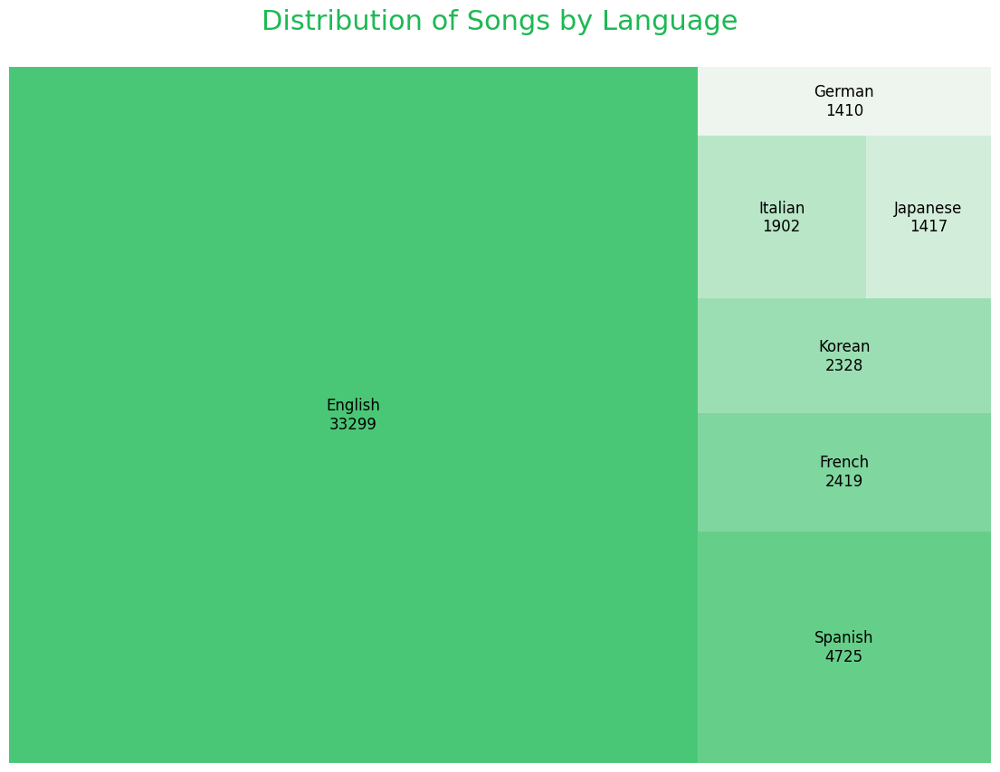

In [ ]:
import squarify
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for treemap
language_counts = data['language'].value_counts()
sizes = language_counts.values
labels = [f"{lang}\n{count}" for lang, count in zip(language_counts.index, sizes)]

# Define an advanced Spotify-inspired gradient
spotify_gradient = sns.light_palette("#1DB954", n_colors=len(sizes), reverse=True)

# Create the treemap
plt.figure(figsize=(14, 10))
squarify.plot(
    sizes=sizes,
    label=labels,
    alpha=0.8,
    color=spotify_gradient,
    text_kwargs={'fontsize': 12, 'color': 'black'}
)
plt.title(
    "Distribution of Songs by Language",
    fontsize=22,
    color='#1DB954',
    pad=30
)
plt.gca().patch.set_facecolor('#191414')  # Dark background for Spotify theme
plt.gca().patch.set_alpha(0.9)
plt.axis('off')  # Remove axes
plt.show()


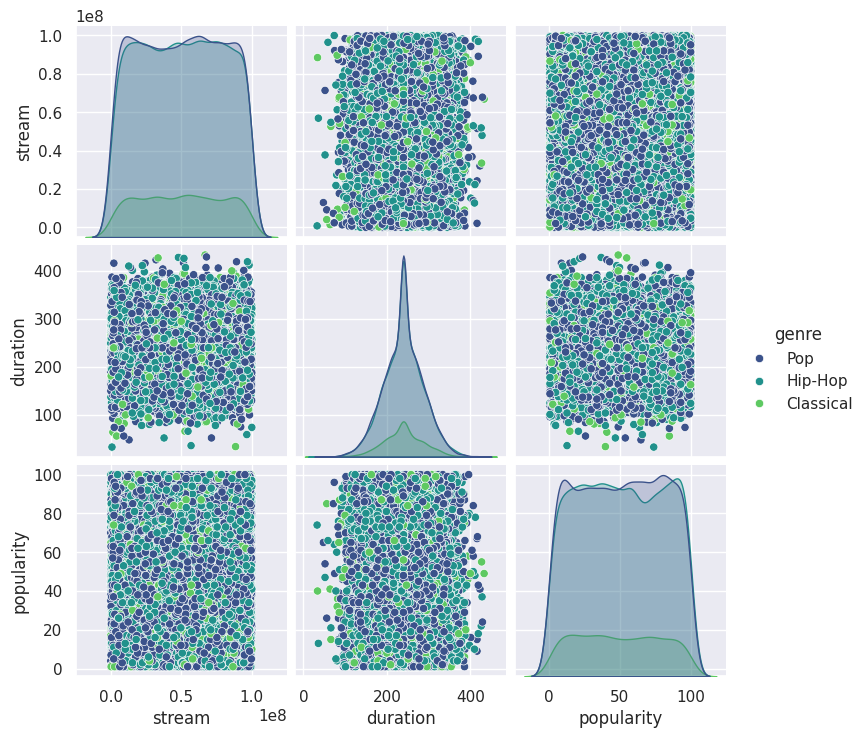

In [ ]:
filtered_data = data[data['genre'].isin(['Pop', 'Hip-Hop', 'Classical'])]
sns.pairplot(filtered_data[['stream', 'duration', 'popularity', 'genre']], hue='genre', palette='viridis', diag_kind='kde', height=2.5)

plt.show()


In [ ]:
# Group and prepare the data for the Sunburst chart
sunburst_data = data.groupby(['genre', 'label']).agg({'popularity': 'sum'}).reset_index()

# Create the Sunburst chart
fig = px.sunburst(
    sunburst_data,
    path=['genre', 'label'],  # Define the hierarchy
    values='popularity',  # Values to visualize
    color='popularity',  # Color by popularity
    color_continuous_scale='Viridis',
    title="Music Distribution: Language and Label Popularity"
)

# Optional: Make the chart more elegant
fig.update_traces(insidetextorientation='radial')

# Make the chart square by setting equal width and height
fig.update_layout(
    width=600,  # Set width
    height=600,  # Set height to make the chart square
    title_font=dict(size=22, color="#1DB954", family="Arial")  # Set title color
)

fig.show()


In [52]:
import pandas as pd
import plotly.express as px

# Extract the release year from the release_date column
data['release_year'] = pd.to_datetime(data['release_date']).dt.year

# Group the data by genre and release year to calculate average popularity
trend_data = data.groupby(['genre', 'release_year']).agg({'popularity': 'mean'}).reset_index()

# Create a bar chart to visualize average popularity of each genre over the years
fig = px.bar(
    trend_data,
    x='release_year',  # X-axis is the release year
    y='popularity',  # Y-axis is the average popularity
    color='genre',  # Color by genre
    barmode='group',  # Group bars by genre
    title="Average Popularity of Music Genres Over Time",
    labels={"release_year": "Year", "popularity": "Average Popularity"},
    color_discrete_sequence=px.colors.sequential.Plasma  # Subtle color palette
)

# Customize the layout for a clean design
fig.update_layout(
    title_font=dict(size=24, color="#1DB954"),  # Spotify green for the title
    title_x=0.5,  # Center the title
    xaxis_title="Year",
    yaxis_title="Average Popularity",
    plot_bgcolor="white",  # White background for the plot
    paper_bgcolor="white",  # Paper background to match plot
    font=dict(color="black"),  # Black text for readability
    xaxis=dict(tickangle=45, gridcolor="gray"),  # Subtle gridlines for x-axis
    yaxis=dict(
        showgrid=True,
        gridcolor="gray",  # Light gridlines for y-axis
        range=[0, 70]  # Set y-axis range to 0 to 120
    ),
    legend_title=dict(font=dict(size=14, color="black")),  # Black legend title for clarity
    legend=dict(
        title="Music Genre",
        font=dict(size=12, color="black"),
        orientation="h",  # Horizontal legend
        x=0.5, y=-0.1,  # Position the legend below the chart
        xanchor="center", yanchor="top"
    ),
    margin=dict(l=40, r=40, t=100, b=100)  # Adjust margins for better spacing
)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming your data is loaded into the 'data' dataframe
# Grouping by genre and release year to calculate average popularity
trend_data = data.groupby(['genre', 'release_year']).agg({'popularity': 'mean'}).reset_index()

# Pivoting the data to create a matrix of average popularity per genre per year
heatmap_data = trend_data.pivot(index='release_year', columns='genre', values='popularity')

# Create a heatmap
fig = px.imshow(
    heatmap_data,
    color_continuous_scale='RdYlBu',  # Use a color scale with better contrast
    labels={'x': 'Music Genre', 'y': 'Year', 'color': 'Popularity'},
    title="Heatmap of Music Genre Popularity Over Time",
)

# Customize layout for aesthetics
fig.update_layout(
    title_font=dict(size=24, color="#1DB954", family="Arial"),  # Spotify green for the title
    title_x=0.5,  # Center the title
    xaxis_title="Music Genre",
    yaxis_title="Year",
    plot_bgcolor="white",  # White background for plot
    paper_bgcolor="white",  # White paper background
    font=dict(color="black"),  # Black text for readability
    xaxis=dict(tickangle=45, tickmode='array'),  # Rotate x-axis labels for better readability
    yaxis=dict(showgrid=True, gridcolor='lightgray', zeroline=False),  # Subtle gridlines
    margin=dict(l=40, r=40, t=100, b=100),  # Adjust margins for better spacing
    coloraxis_colorbar=dict(title="Popularity", ticks="outside", tickcolor="black", tickvals=[0, 50, 100, 150, 200])  # Improve color bar
)



# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming your data is loaded into the 'data' dataframe
# Grouping by genre and release year to calculate average popularity
trend_data = data.groupby(['genre', 'release_year']).agg({'popularity': 'mean'}).reset_index()

# Pivoting the data to create a matrix of average popularity per genre per year
heatmap_data = trend_data.pivot(index='release_year', columns='genre', values='popularity')

# Create a heatmap with improved aesthetics
fig = px.imshow(
    heatmap_data,
    color_continuous_scale='YlGnBu',  # A more subtle, smooth color scale with green-to-blue
    labels={'x': 'Music Genre', 'y': 'Year', 'color': 'Popularity'},
    title="Shifting Trends in Music Genre Popularity",
)

# Customize layout for improved visuals
fig.update_layout(
    title_font=dict(size=26, color="#1DB954", family="Arial"),  # Centered and larger title with Spotify Green
    title_x=0.5,  # Center the title
    xaxis_title="Music Genre",
    yaxis_title="Year",
    plot_bgcolor="white",  # White background for the plot
    paper_bgcolor="white",  # White background for the paper
    font=dict(color="black"),  # Set black text color for better readability
    xaxis=dict(
        tickangle=45,  # Rotate x-axis labels for better readability
        showgrid=True,  # Show grid lines for better data interpretation
        gridcolor='lightgray',  # Light grid color for subtle contrast
    ),
    yaxis=dict(
        showgrid=True,  # Show grid lines on y-axis for better data interpretation
        gridcolor='lightgray',  # Light grid color for consistency
    ),
    coloraxis_colorbar=dict(
        title="Popularity",
        ticks="outside",
        tickcolor="black",
        tickvals=[0, 50, 100, 150, 200],
        ticktext=["0", "50", "100", "150", "200"],  # Ticks adjusted for better clarity
    ),
    margin=dict(l=50, r=50, t=120, b=80),  # Adjust margins to give enough space
)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming 'data' is your DataFrame and 'explicit_content' is the column indicating explicit content (1 for explicit, 0 for clean)
# Grouping the data by year and explicit content
explicit_content_data = data.groupby(['release_year', 'explicit_content', 'genre']).size().reset_index(name='count')

# Rename the columns for clarity
explicit_content_data.columns = ['release_year', 'explicit_content', 'genre', 'count']

# Now we want to pivot the data so that we can easily visualize explicit content vs. clean content per genre
explicit_content_data_pivot = explicit_content_data.pivot_table(index=['release_year', 'genre'], columns='explicit_content', values='count', aggfunc='sum').reset_index()

# Rename the columns to 'Explicit' and 'Clean'
explicit_content_data_pivot.columns = ['release_year', 'genre', 'Clean', 'Explicit']

# Create a stacked bar chart to show the trends in explicit content per genre over time
fig = px.bar(
    explicit_content_data_pivot,
    x='release_year',
    y=['Clean', 'Explicit'],
    color='genre',
    title="Trends in Explicit Content in Music Over Time",
    labels={"release_year": "Year", "value": "Number of Songs", "genre": "Music Genre"},
    text_auto=True,  # Display values on the bars
    category_orders={"genre": ['Classical', 'Country', 'Electronic', 'Folk', 'Hip-Hop', 'Jazz', 'Pop', 'R&B', 'Reggae']},  # Order genres
    color_discrete_sequence=px.colors.qualitative.Set2  # Use subtle color scheme
)

# Customize layout
fig.update_layout(
    title_font=dict(size=24, color="#1DB954"),  # Spotify green for the title
    title_x=0.5,  # Center the title
    xaxis_title="Year",
    yaxis_title="Number of Songs",
    plot_bgcolor="white",  # White background for plot
    paper_bgcolor="white",  # White paper background
    font=dict(color="black"),  # Black text for readability
    xaxis=dict(tickangle=45),  # Rotate x-axis labels for better readability
    barmode='stack',  # Stack bars for explicit and clean content
    margin=dict(l=40, r=40, t=100, b=100)  # Adjust margins for better spacing
)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Grouping by 'release_year' and 'explicit_content' to get count of explicit vs non-explicit content
explicit_content_data = data.groupby(['release_year', 'explicit_content']).size().reset_index(name='count')

# Pivot the data to format it for heatmap visualization
heatmap_data = explicit_content_data.pivot_table(index='release_year', columns='explicit_content', values='count', fill_value=0)

# Create a heatmap using Plotly Express
fig = px.imshow(
    heatmap_data.T,  # Transpose to make explicit_content rows
    labels={'x': 'Year', 'y': 'Explicit Content'},
    title="Trends in Explicit Content Over Time",
    color_continuous_scale='Viridis',  # A sleek, professional color scale
    color_continuous_midpoint=heatmap_data.max().max()/2,  # Center color scale at midpoint for contrast
)

# Enhance the layout and design
fig.update_layout(
    title_font=dict(size=24, color="#1DB954", family="Arial"),  # Using Spotify green for title
    title_x=0.5,  # Centering title
    xaxis_title="Year",
    yaxis_title="Explicit Content",
    xaxis=dict(showgrid=True, gridcolor="#1DB954", tickangle=45, tickmode='linear'),  # Clean gridlines and rotated labels
    yaxis=dict(showgrid=True, gridcolor="#1DB954"),  # Y-axis gridlines in Spotify Green
    plot_bgcolor="white",  # White background for the plot
    paper_bgcolor="white",  # White background for the overall paper
    font=dict(color="black"),  # Black font color for readability
    margin=dict(l=50, r=50, t=100, b=50)  # Adjusting margins for clarity and neatness
)

# Display the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming 'data' is your dataframe containing the Spotify dataset
# Grouping by release year, genre, and explicit content to calculate the counts
explicit_content_data = data.groupby(['release_year', 'genre', 'explicit_content']).size().reset_index(name='count')

# Pivot the data to have explicit and non-explicit columns
explicit_content_pivot = explicit_content_data.pivot_table(index=['release_year', 'genre'], columns='explicit_content', values='count', fill_value=0).reset_index()

# Renaming columns for clarity
explicit_content_pivot.columns = ['release_year', 'genre', 'Non-Explicit', 'Explicit']

# Create a stacked area chart for trends
fig = px.area(
    explicit_content_pivot,
    x='release_year',
    y=['Non-Explicit', 'Explicit'],
    color='genre',
    title="Trends in Explicit Content Across Music Genres Over Time",
    labels={"release_year": "Year", "value": "Track Count"},
    line_group='genre',
    color_discrete_sequence=px.colors.sequential.Plasma,  # Subtle color theme
    template="plotly_white"  # Clean, white background
)

# Customize layout to match design
fig.update_layout(
    title_font=dict(size=24, color="#1DB954", family="Arial"),  # Spotify green for title
    title_x=0.5,  # Center the title
    xaxis_title="Year",
    yaxis_title="Track Count",
    font=dict(color="black"),  # Black font for readability
    xaxis=dict(showgrid=True, gridcolor="#E0E0E0"),  # Light gridlines
    yaxis=dict(showgrid=True, gridcolor="#E0E0E0"),  # Light gridlines
    legend_title=dict(font=dict(size=14, color="black")),  # Clear legend title
    margin=dict(l=40, r=40, t=100, b=100)  # Adjust margins for better spacing
)

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming 'data' is your dataframe containing the Spotify dataset
# Group the data by year and explicit content to calculate the count of explicit vs non-explicit content
explicit_content_data = data.groupby(['release_year', 'explicit_content']).size().reset_index(name='count')

# Create a pivot table for heatmap visualization
heatmap_data = explicit_content_data.pivot_table(index='release_year', columns='explicit_content', values='count', fill_value=0)

# Create a heatmap
fig = px.imshow(
    heatmap_data.T,  # Transpose to get explicit content as rows
    labels={'x': 'Year', 'y': 'Explicit Content'},
    title="Trends in Explicit Content Over Time",
    color_continuous_scale='YlGnBu',  # A more professional color scale (yellow to blue)
    color_continuous_midpoint=heatmap_data.max().max()/2,  # Center color scale at the mid value
)

# Customize layout for better aesthetics
fig.update_layout(
    title_font=dict(size=24, color="#1DB954", family="Arial"),  # Spotify green for title
    title_x=0.5,  # Center the title
    xaxis_title="Year",
    yaxis_title="Explicit Content",
    xaxis=dict(showgrid=True, gridcolor="#1DB954", tickangle=45),  # Show gridlines with Spotify green
    yaxis=dict(showgrid=True, gridcolor="#1DB954"),  # Show gridlines
    plot_bgcolor="white",  # White background
    paper_bgcolor="white",  # White paper background
    font=dict(color="black"),  # Black font for clarity
    margin=dict(l=50, r=50, t=100, b=50)  # Adjust margins for better spacing
)

# Display the plot
fig.show()


In [ ]:
print(data.columns)


Index(['song_id', 'song_title', 'artist', 'album', 'genre', 'release_date',
       'duration', 'popularity', 'stream', 'language', 'explicit_content',
       'label', 'composer', 'producer', 'collaboration'],
      dtype='object')


In [ ]:
# Convert release_date to datetime
data['release_date'] = pd.to_datetime(data['release_date'])

# Fill missing values in duration with the mean
data['duration'] = data['duration'].fillna(data['duration'].mean())

# Check if there are still missing values
print(data['duration'].isnull().sum())


0


In [ ]:
data['release_date'] = pd.to_datetime(data['release_date'])


In [ ]:
data['duration'] = data['duration'].fillna(data['duration'].mean())


In [ ]:
print(data['duration'].isnull().sum())  # Check if there are still missing values


0


In [ ]:
print(data['genre'].value_counts())
print(data['language'].value_counts())


genre
Electronic    12568
Pop           12534
Hip-Hop       12298
Folk           2559
Classical      2542
Country        2511
Jazz           2504
R&B            1513
Reggae          971
Name: count, dtype: int64
language
English     33299
Spanish      4725
French       2419
Korean       2328
Italian      1902
Japanese     1417
German       1410
Name: count, dtype: int64


In [ ]:
print(data.columns)


Index(['song_id', 'song_title', 'artist', 'album', 'genre', 'release_date',
       'duration', 'popularity', 'stream', 'language', 'explicit_content',
       'label', 'composer', 'producer', 'collaboration'],
      dtype='object')


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming your data is loaded into the 'data' dataframe
# Extract relevant columns: genre, duration, and popularity
scatter_data = data[['genre', 'duration', 'popularity']]

# Create a scatter plot to explore the relationship between song duration and popularity
fig = px.scatter(
    scatter_data,
    x='duration',  # X-axis: song duration
    y='popularity',  # Y-axis: popularity
    color='genre',  # Color by genre to differentiate the trends
    title="Music Genre Popularity vs. Song Duration",  # Title for the chart
    labels={"duration": "Song Duration (seconds)", "popularity": "Popularity"},  # Axis labels
    color_discrete_sequence=px.colors.sequential.Plasma  # Use a color palette for clarity
)

# Customize the layout for a clean and aesthetic look
fig.update_layout(
    title_font=dict(size=24, color="#0077b6"),  # Blue title for consistency with the theme
    title_x=0.5,  # Center the title
    xaxis_title="Song Duration (seconds)",  # X-axis label
    yaxis_title="Popularity",  # Y-axis label
    plot_bgcolor="white",  # White background for better clarity
    paper_bgcolor="white",  # Paper background to match the plot
    font=dict(color="black"),  # Black text for readability
    xaxis=dict(showgrid=True, gridcolor="#0077b6"),  # Blue gridlines for the x-axis
    yaxis=dict(showgrid=True, gridcolor="#0077b6"),  # Blue gridlines for the y-axis
    margin=dict(l=40, r=40, t=100, b=100)  # Adjust margins for better spacing
)

# Show the plot
fig.show()


In [ ]:
import plotly.express as px

# Group by 'artist' and calculate the mean popularity for each artist
artist_popularity = data.groupby('artist')['popularity'].mean().reset_index()

# Sort the artists by popularity in descending order
artist_popularity_sorted = artist_popularity.sort_values('popularity', ascending=False)

# Create the bar chart to visualize music popularity by artist
fig = px.bar(
    artist_popularity_sorted,
    x='artist',  # X-axis corresponds to 'artist'
    y='popularity',  # Y-axis corresponds to 'popularity'
    title="Music Popularity by Artist",
    labels={"popularity": "Average Popularity", "artist": "Artist"},
    color='popularity',  # Color the bars by popularity
    color_continuous_scale='Viridis'  # Use a color scale for the bars
)

# Customize the layout for better visualization
fig.update_layout(
    title_font=dict(size=24, color="#1DB954"),  # Green color for title
    title_x=0.5,  # Center the title
    xaxis_title="Artist",
    yaxis_title="Average Popularity",
    plot_bgcolor="white",  # Set plot background to white
    paper_bgcolor="white",  # Set paper background to white
    xaxis_tickangle=45,  # Angle the x-axis labels for better readability
    xaxis_showgrid=False,  # Remove gridlines on x-axis
    yaxis_showgrid=True,  # Add gridlines on y-axis
    showlegend=False,  # Disable legend
    width=900,  # Increase the width of the plot
    height=600  # Increase the height of the plot
)

# Display the plot
fig.show()


<ipython-input-21-40d1489df33f>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




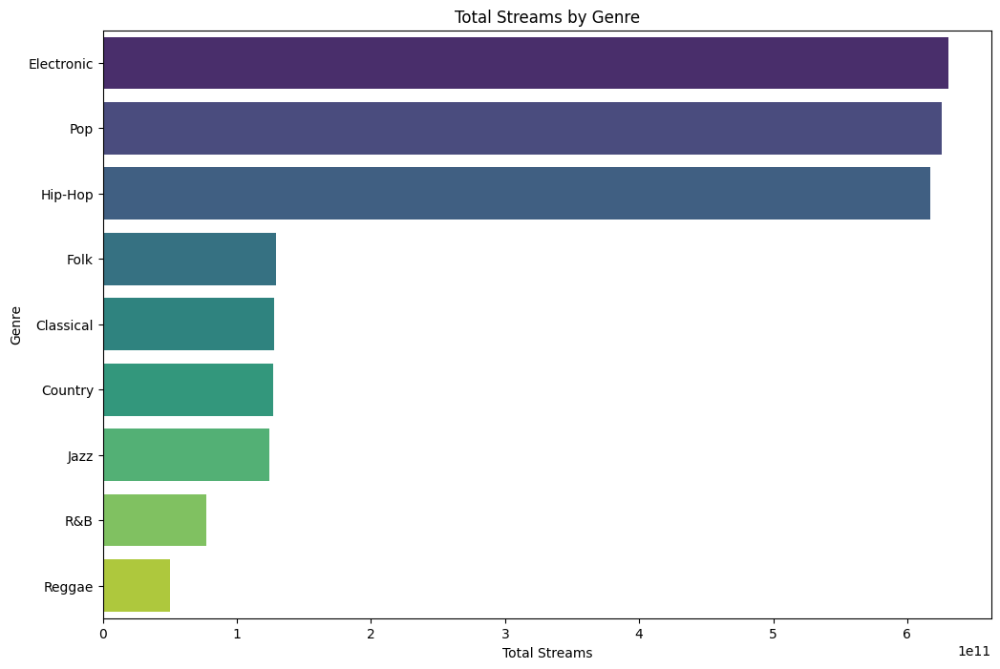

In [ ]:
genre_streams = data.groupby('genre')['stream'].sum().sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x=genre_streams.values, y=genre_streams.index, palette='viridis')
plt.title("Total Streams by Genre")
plt.xlabel("Total Streams")
plt.ylabel("Genre")
plt.show()


<ipython-input-22-85d95f713e9e>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




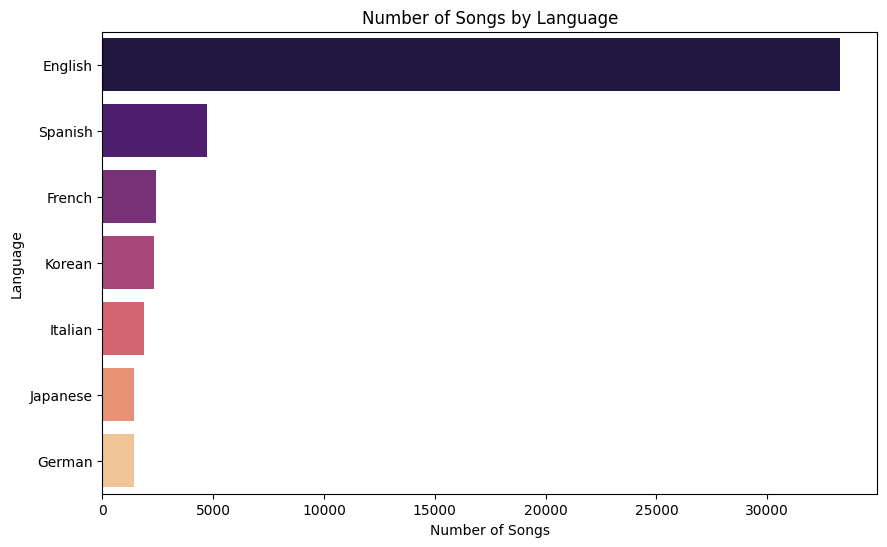

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(y=data['language'].value_counts().index, x=data['language'].value_counts().values, palette='magma')
plt.title("Number of Songs by Language")
plt.xlabel("Number of Songs")
plt.ylabel("Language")
plt.show()


In [ ]:
fig = px.sunburst(
    data,
    path=['language', 'label', 'release_year'],  # Use 'release_year' instead of 'year'
    values='popularity',  # Metric for visualization
    color='popularity',
    color_continuous_scale=[[0, "#eeef20"], [1, "#007f5f"]],  # Shades of green
    title="A Detailed Look at Language, Label, and Year"
)

# Apply white background and aesthetic enhancements
fig.update_layout(
    template='plotly_white',  # Set white background
    title_font=dict(size=16, color="#1DB954", family="Arial"),  # Spotify green for title
    coloraxis_colorbar=dict(
        title="Popularity",
        ticks="outside",
        tickcolor="pink",  # Change ticks color to black for better visibility
        lenmode="pixels",
        len=300
    ),
    font=dict(color="black"),  # Black text for better contrast on white background
    margin=dict(t=60, b=60, l=60, r=60),  # Add more margins for cleaner spacing
    height=600,  # Square shape height
    width=600,  # Square shape width
    showlegend=True  # Ensure the legend is visible for better context
)

# Enhance traces with better visual appeal
fig.update_traces(
    insidetextorientation='radial',  # Radial text orientation
    textinfo="label+percent parent",  # Include percentage and label in each segment
    marker=dict(line=dict(color="#006400", width=1))  # Darker border for better contrast
)

fig.show()


In [ ]:
!pip install joypy


In [ ]:
!pip install squarify

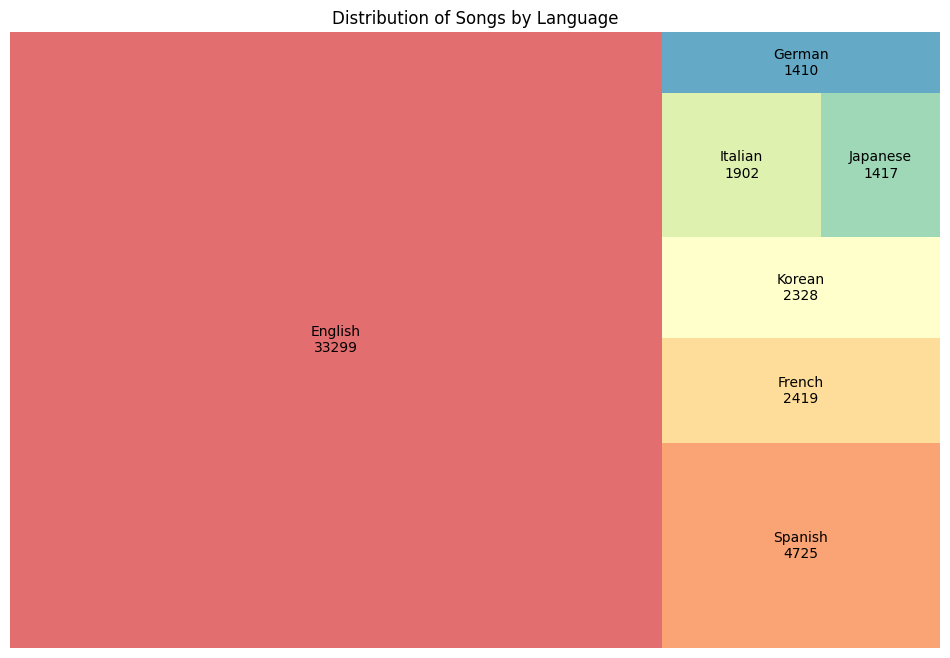

In [ ]:
import squarify

# Prepare data for treemap
language_counts = data['language'].value_counts()
sizes = language_counts.values
labels = [f"{lang}\n{count}" for lang, count in zip(language_counts.index, sizes)]

plt.figure(figsize=(12, 8))
squarify.plot(sizes=sizes, label=labels, alpha=0.8, color=sns.color_palette('Spectral', len(sizes)))
plt.title("Distribution of Songs by Language")
plt.axis('off')
plt.show()


In [ ]:
import plotly.express as px

# Fill NaN values in 'language' and 'label'
data['language'] = data['language'].fillna('Unknown')
data['label'] = data['label'].fillna('Unknown')

# Create the Sunburst chart
fig = px.sunburst(
    data,  # Your DataFrame
    path=['language', 'label'],  # Use 'language' and 'label' for hierarchy
    values='stream',  # Use 'stream' to size the segments
    color='popularity',  # Color based on 'popularity'
    color_continuous_scale='Viridis',  # Choose a color scale
    title="Sunburst Chart: Language and Label Hierarchy Based on Streams"
)

# Optional: Customize layout for Spotify theme
fig.update_layout(
    template='plotly_dark',
    title_font=dict(size=22, color="#1DB954", family="Arial"),
    coloraxis_colorbar=dict(title="Popularity", ticks="outside", tickcolor="white"),
)

# Show the chart
fig.show()


In [ ]:
# Improved Sunburst Chart
fig = px.sunburst(
    data,
    path=['language', 'label', 'release_year'],  # Deeper hierarchy
    values='stream',
    color='popularity',
    color_continuous_scale='Plasma',  # Custom color scale
    title="Enhanced Sunburst Chart: Language, Label, and Year"
)

# Spotify-Themed Enhancements
fig.update_layout(
    template='plotly_dark',
    title_font=dict(size=24, color="#1DB954", family="Arial"),
    coloraxis_colorbar=dict(
        title="Popularity",
        tickcolor="white",
        ticks="outside",
        lenmode="pixels",
        len=300
    ),
    margin=dict(t=50, b=50, l=50, r=50)  # Add margins for better visibility
)

fig.update_traces(
    insidetextorientation='radial',  # Radial text orientation
    textinfo="label+percent parent",  # Include percentage info
    marker=dict(line=dict(color="#191414", width=0.5))  # Better contrast
)

fig.show()


In [ ]:
fig = px.sunburst(
    data,
    path=['language', 'label', 'release_year'],  # Use 'release_year' instead of 'year'
    values='popularity',  # Metric for visualization
    color='popularity',
    color_continuous_scale=[[0, "#1DB954"], [0.5, "#FF4081"], [1, "#FFC107"]],  # Blending green with pink and yellow
    title="Enhanced Spotify-Themed Sunburst Chart: Language, Label, and Year"
)

fig.update_layout(
    template='plotly_dark',
    title_font=dict(size=22, color="#1DB954", family="Arial"),
    coloraxis_colorbar=dict(title="Popularity", ticks="outside", tickcolor="white"),
    font=dict(color="white")
)

fig.update_traces(
    insidetextorientation='radial',  # Radial text orientation
    textinfo="label+percent parent",  # Include percentage info
    marker=dict(line=dict(color="#191414", width=0.5))  # Better contrast
)

fig.show()


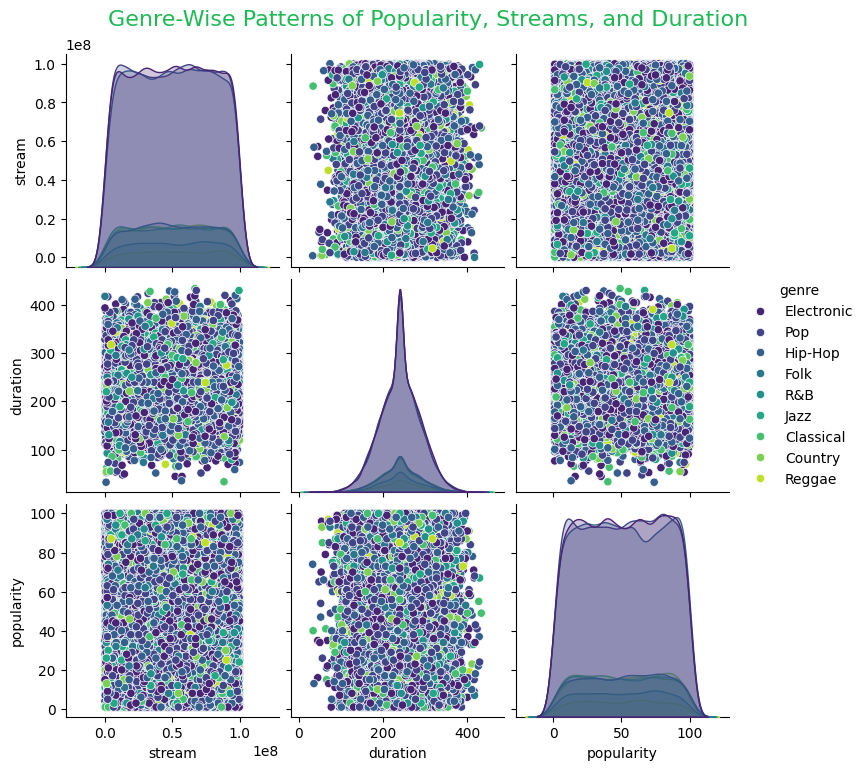

In [ ]:
# Create the pairplot
pairplot = sns.pairplot(
    data[['stream', 'duration', 'popularity', 'genre']],
    hue='genre',
    palette='viridis',
    diag_kind='kde',
    height=2.5
)

# Add a title
pairplot.fig.suptitle(
    "Genre-Wise Patterns of Popularity, Streams, and Duration",
    y=1.02,
    fontsize=16,
    color="#1DB954"
)

# Show the plot
plt.show()


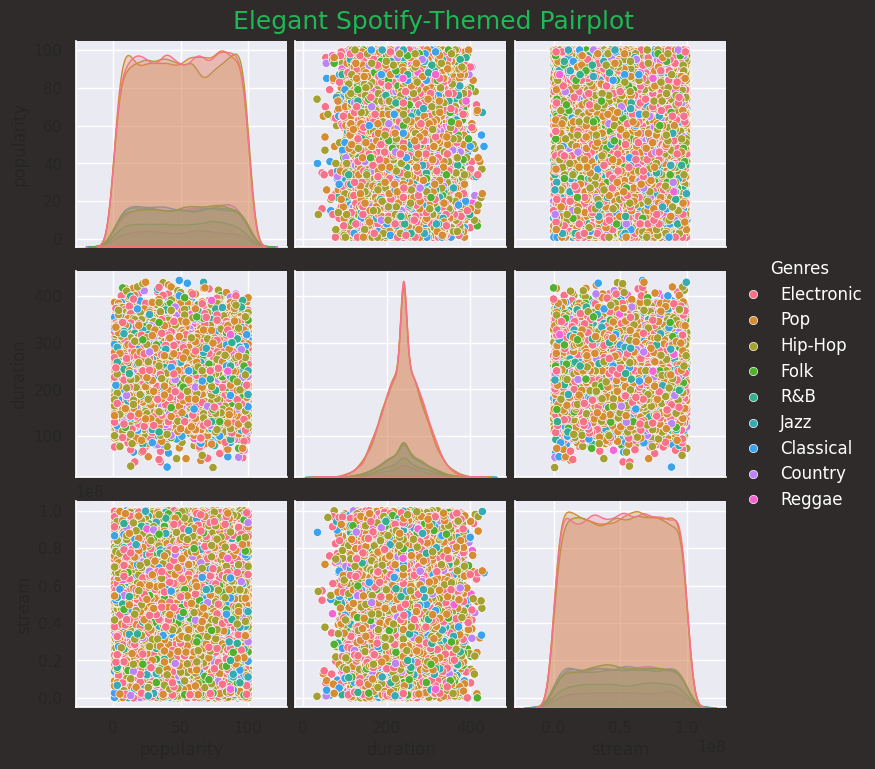

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set Spotify-inspired theme
sns.set_theme(style="darkgrid", palette="husl")

# Create the pairplot
pairplot = sns.pairplot(
    data=data[['popularity', 'duration', 'stream', 'genre']],  # Correct DataFrame columns
    hue='genre',  # Color by genre
    height=2.5
)

# Customize the plot for Spotify theme
pairplot.fig.patch.set_facecolor('#191414')  # Spotify dark background
pairplot.fig.patch.set_alpha(0.9)

# Adjust legend
plt.setp(pairplot._legend.get_texts(), fontsize=12, color="white")
pairplot._legend.set_title("Genres")
pairplot._legend.get_title().set_color("white")

# Add title
pairplot.fig.suptitle(
    "Elegant Spotify-Themed Pairplot",
    y=1.02,
    fontsize=18,
    color="#1DB954"
)

# Show the plot
plt.show()


In [ ]:
# Import the required libraries
import plotly.express as px  # Import Plotly Express for visualizations

# Create the 3D scatter plot
fig = px.scatter_3d(
    data,
    x='stream',  # X-axis corresponds to 'stream'
    y='duration',  # Y-axis corresponds to 'duration'
    z='popularity',  # Z-axis corresponds to 'popularity'
    color='genre',  # Color by 'genre'
    size='popularity',  # Bubble size based on popularity
    title="3D Scatter Plot: Streams, Duration, and Popularity by Genre",
    color_discrete_sequence=px.colors.qualitative.Bold  # Use bold colors
)

# Update layout for better visualization
fig.update_layout(
    scene=dict(
        xaxis_title="Streams",
        yaxis_title="Duration",
        zaxis_title="Popularity"
    )
)

# Display the plot
fig.show()


In [ ]:
# Extract year from release_date
data['release_year'] = data['release_date'].dt.year

fig = px.scatter(
    data,
    x='popularity',
    y='stream',
    size='duration',
    color='genre',
    animation_frame='release_year',
    title="Animated Bubble Chart: Streams Over Release Years"
)
fig.show()


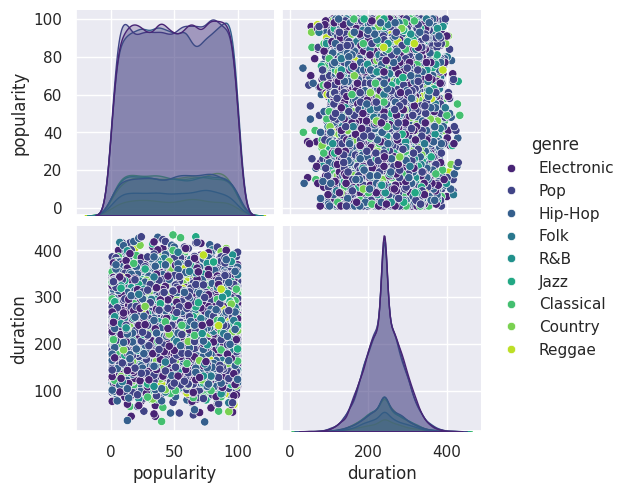

In [ ]:
sns.pairplot(data[['popularity', 'duration', 'genre']], hue='genre', palette='viridis', diag_kind='kde', height=2.5)
plt.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming 'data' is your dataframe containing the Spotify dataset
# Group the data by 'genre' and 'release_year' to get trends for popularity
trend_data = data.groupby(['genre', 'release_year']).agg({'popularity': 'mean'}).reset_index()

# Create a line plot to visualize trends over time by genre
fig = px.line(
    trend_data,
    x='release_year',  # X-axis corresponds to 'release_year'
    y='popularity',  # Y-axis corresponds to 'popularity'
    color='genre',  # Color by genre
    title="Trends in Music Popularity by Genre",
    line_group='genre',  # Group lines by genre
    markers=True  # Show markers for each data point
)

# Customize the layout to match the style
fig.update_layout(
    title_font=dict(size=30, color="#1DB954"),  # Green color for title and larger size
    title_x=0.5,  # Center title
    xaxis_title="Year",  # Label for x-axis
    yaxis_title="Average Popularity",  # Label for y-axis
    plot_bgcolor="white",  # Set plot background to white
    paper_bgcolor="white",  # Set paper background to white
    legend_title="Genre",
    xaxis=dict(showgrid=True, gridcolor='gray', tickangle=45),  # Add grid and angle x-axis labels
    yaxis=dict(showgrid=True, gridcolor='lightgray'),  # Grid lines in light gray
    width=1000,  # Increase width for better clarity
    height=600,  # Increase height for better visibility
    margin=dict(l=50, r=50, t=100, b=100),  # Adjust margins for better layout
    legend=dict(x=0.8, y=0.2, traceorder="normal", font=dict(size=12))  # Position legend and customize font size
)

# Display the plot
fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Assuming 'data' is your dataframe containing the Spotify dataset
# Group the data by 'genre' and 'release_year' to get trends for popularity
trend_data = data.groupby(['genre', 'release_year']).agg({'popularity': 'mean'}).reset_index()

# Create a line plot to visualize trends over time by genre
fig = px.line(
    trend_data,
    x='release_year',  # X-axis corresponds to 'release_year'
    y='popularity',  # Y-axis corresponds to 'popularity'
    color='genre',  # Color by genre
    title="Trends in Music Popularity by Genre",
    line_group='genre',  # Group lines by genre
    markers=True  # Show markers for each data point
)

# Customize the layout to match a clean, modern design
fig.update_layout(
    title_font=dict(size=30, color="#1DB954", family="Roboto, sans-serif"),  # Green color for title
    title_x=0.5,  # Center title
    xaxis_title="Year",
    yaxis_title="Popularity",
    xaxis=dict(
        showgrid=True,
        gridcolor='rgba(200, 200, 200, 0.3)',  # Subtle gridlines for a lighter feel
        showline=True,
        linecolor='rgba(100, 100, 100, 0.7)',  # Lighter axis line color
        ticks="outside",
        ticklen=5,
    ),
    yaxis=dict(
        showgrid=True,
        gridcolor='rgba(200, 200, 200, 0.3)',
        showline=True,
        linecolor='rgba(100, 100, 100, 0.7)',
        ticks="outside",
        ticklen=5,
    ),
    plot_bgcolor="white",  # Set plot background to white
    paper_bgcolor="white",  # Set paper background to white
    legend_title="Genre",
    legend=dict(
        orientation="h",  # Horizontal layout for the legend
        yanchor="bottom",
        y=1.05,
        xanchor="center",
        x=0.5,
        font=dict(size=12),  # Font size for legend items
        borderwidth=1,  # Add border around the legend for separation
        bordercolor='rgba(200, 200, 200, 0.3)',
    )
)

# Enhance line and marker styles for better readability
fig.update_traces(
    line=dict(width=3, color='rgba(100, 100, 100, 0.7)'),  # Thicker lines
    marker=dict(size=7, symbol='circle', line=dict(width=2, color="white"), opacity=0.9)  # Larger markers with white borders and opacity
)

# Display the plot
fig.show()


In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Preparing data for chord-like visualization
top_genres = data['genre'].value_counts().index[:5]  # Top 5 genres
filtered_data = data[data['genre'].isin(top_genres)]
label_counts = filtered_data.groupby(['genre', 'label']).size().reset_index(name='counts')

# Create Sankey-like flow
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=list(set(label_counts['genre']) | set(label_counts['label'])),
        color="rgba(29, 185, 84, 1)"
    ),
    link=dict(
        source=label_counts['genre'].apply(lambda x: list(set(label_counts['genre'])).index(x)),
        target=label_counts['label'].apply(lambda x: list(set(label_counts['label'])).index(x) + len(set(label_counts['genre']))),
        value=label_counts['counts']
    )
)])

fig.update_layout(
    title_text="Exploring Genre-Label Connections in Spotify's Music Ecosystem",
    title_font=dict(size=16, color="#1DB954")  # Set the title color to Spotify green
)



In [ ]:
fig.write_html("chord_diagram.html")  # Save the chart as an HTML file


In [ ]:
from google.colab import files
files.download("chord_diagram.html")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# Group and prepare the data for the Sunburst chart
sunburst_data = data.groupby(['genre', 'label']).agg({'popularity': 'sum'}).reset_index()

# Create the Sunburst chart
fig = px.sunburst(
    sunburst_data,
    path=['genre', 'label'],  # Define the hierarchy
    values='popularity',  # Values to visualize
    color='popularity',  # Color by popularity
    color_continuous_scale='Viridis',
    title="Sunburst Chart: Genre and Label Hierarchy"
)

# Optional: Make the chart more elegant
fig.update_traces(insidetextorientation='radial')
fig.show()


In [ ]:
fig = px.scatter_3d(
    data,
    x='popularity',
    y='stream',
    z='duration',
    color='genre',
    size='popularity',
    title="3D Scatter: Streams vs Popularity vs Duration",
    color_discrete_sequence=px.colors.qualitative.Dark2
)
fig.update_traces(marker=dict(opacity=0.7))
fig.show()


In [ ]:
fig = px.scatter(
    data,
    x='popularity',
    y='stream',
    size='duration',
    color='genre',
    animation_frame='release_year',
    title="Animated Bubble Chart: Popularity vs Streams Over Years",
    color_discrete_sequence=px.colors.qualitative.Plotly
)
fig.show()


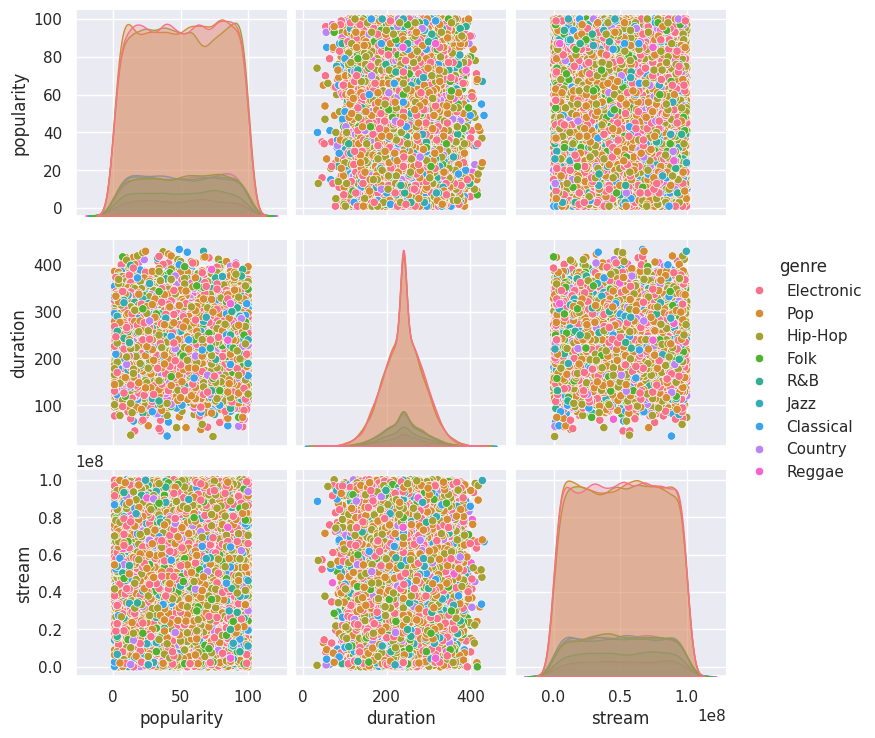

In [ ]:
import seaborn as sns

sns.pairplot(data[['popularity', 'duration', 'stream', 'genre']], hue='genre', height=2.5)
plt.show()


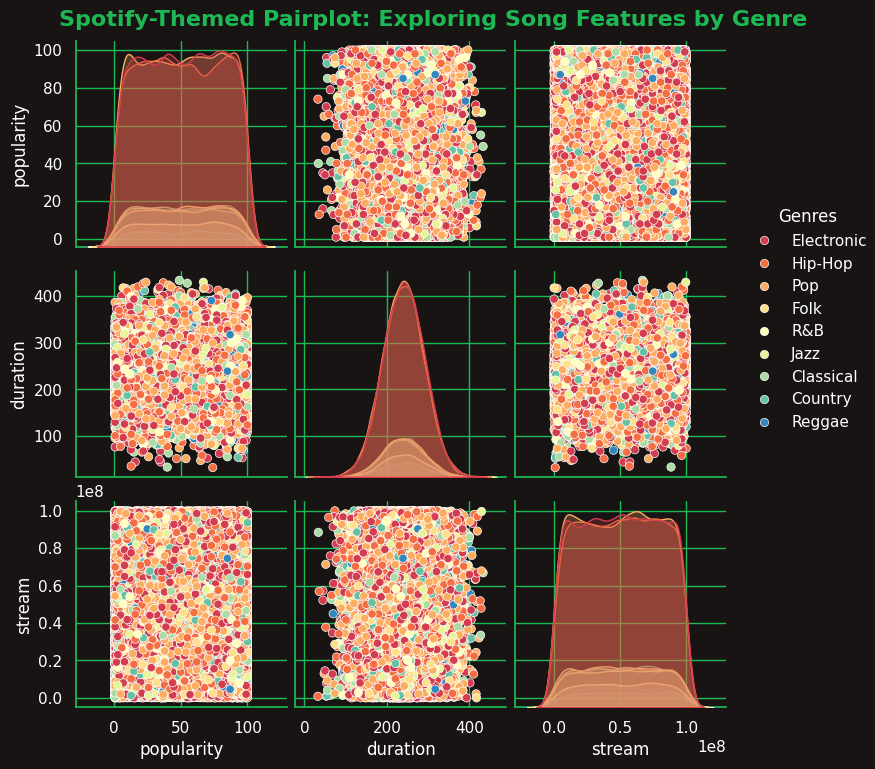

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set a Spotify-themed style
sns.set_theme(style="darkgrid", rc={
    "axes.facecolor": "#191414",  # Spotify dark background
    "figure.facecolor": "#191414",
    "grid.color": "#1DB954",  # Spotify green gridlines
    "text.color": "white",
    "axes.labelcolor": "white",
    "xtick.color": "white",
    "ytick.color": "white",
    "axes.edgecolor": "#1DB954",  # Spotify green borders
})

# Generate the pairplot
pairplot = sns.pairplot(
    data[['popularity', 'duration', 'stream', 'genre']],
    hue='genre',
    palette='Spectral',  # Vibrant colors for genres
    height=2.5
)

# Customize legend for better visibility
pairplot._legend.set_title("Genres")
pairplot._legend.get_frame().set_facecolor("#121212")  # Dark legend background
pairplot._legend.get_frame().set_edgecolor("#1DB954")  # Green legend border
pairplot._legend.get_frame().set_linewidth(1.5)
pairplot._legend.set_bbox_to_anchor((1, 0.6))

# Add a title
plt.suptitle(
    "Spotify-Themed Pairplot: Exploring Song Features by Genre",
    x=0.5,
    y=1.02,
    fontsize=16,
    fontweight='bold',
    color='#1DB954'
)

# Show the plot
plt.show()
